In [144]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.datasets import make_regression
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import r2_score
import warnings
warnings.filterwarnings('ignore')

In [128]:
df=pd.read_csv('temparature.csv')

In [13]:
df.head()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,30-06-2013,28.7,21.4,58.255688,91.116364,28.074101,23.006936,6.818887,69.451805,...,0.0,0.0,0.0,37.6046,126.991,212.3350,2.7850,5992.895996,29.1,21.2
1,2.0,30-06-2013,31.9,21.6,52.263397,90.604721,29.850689,24.035009,5.691890,51.937448,...,0.0,0.0,0.0,37.6046,127.032,44.7624,0.5141,5869.312500,30.5,22.5
2,3.0,30-06-2013,31.6,23.3,48.690479,83.973587,30.091292,24.565633,6.138224,20.573050,...,0.0,0.0,0.0,37.5776,127.058,33.3068,0.2661,5863.555664,31.1,23.9
3,4.0,30-06-2013,32.0,23.4,58.239788,96.483688,29.704629,23.326177,5.650050,65.727144,...,0.0,0.0,0.0,37.6450,127.022,45.7160,2.5348,5856.964844,31.7,24.3
4,5.0,30-06-2013,31.4,21.9,56.174095,90.155128,29.113934,23.486480,5.735004,107.965535,...,0.0,0.0,0.0,37.5507,127.135,35.0380,0.5055,5859.552246,31.2,22.5


In [14]:
df.shape

(7752, 25)

In [15]:
df.dtypes

station             float64
Date                 object
Present_Tmax        float64
Present_Tmin        float64
LDAPS_RHmin         float64
LDAPS_RHmax         float64
LDAPS_Tmax_lapse    float64
LDAPS_Tmin_lapse    float64
LDAPS_WS            float64
LDAPS_LH            float64
LDAPS_CC1           float64
LDAPS_CC2           float64
LDAPS_CC3           float64
LDAPS_CC4           float64
LDAPS_PPT1          float64
LDAPS_PPT2          float64
LDAPS_PPT3          float64
LDAPS_PPT4          float64
lat                 float64
lon                 float64
DEM                 float64
Slope               float64
Solar radiation     float64
Next_Tmax           float64
Next_Tmin           float64
dtype: object

In [16]:
df.isnull()

,station,Date,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
1,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7747,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7748,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7749,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False
7750,True,True,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [17]:
df.isnull().sum()

station              2
Date                 2
Present_Tmax        70
Present_Tmin        70
LDAPS_RHmin         75
LDAPS_RHmax         75
LDAPS_Tmax_lapse    75
LDAPS_Tmin_lapse    75
LDAPS_WS            75
LDAPS_LH            75
LDAPS_CC1           75
LDAPS_CC2           75
LDAPS_CC3           75
LDAPS_CC4           75
LDAPS_PPT1          75
LDAPS_PPT2          75
LDAPS_PPT3          75
LDAPS_PPT4          75
lat                  0
lon                  0
DEM                  0
Slope                0
Solar radiation      0
Next_Tmax           27
Next_Tmin           27
dtype: int64

need to handle null values.

In [18]:
from sklearn.impute import SimpleImputer
imp=SimpleImputer(strategy='most_frequent')
df['station']=imp.fit_transform(df['station'].values.reshape(-1,1))
df['Date']=imp.fit_transform(df['Date'].values.reshape(-1,1))
df['Present_Tmax']=imp.fit_transform(df['Present_Tmax'].values.reshape(-1,1))
df['Present_Tmin']=imp.fit_transform(df['Present_Tmin'].values.reshape(-1,1))
df['LDAPS_RHmin']=imp.fit_transform(df['LDAPS_RHmin'].values.reshape(-1,1))
df['LDAPS_RHmax']=imp.fit_transform(df['LDAPS_RHmax'].values.reshape(-1,1))
df['LDAPS_Tmax_lapse']=imp.fit_transform(df['LDAPS_Tmax_lapse'].values.reshape(-1,1))
df['LDAPS_Tmin_lapse']=imp.fit_transform(df['LDAPS_Tmin_lapse'].values.reshape(-1,1))
df['LDAPS_WS']=imp.fit_transform(df['LDAPS_WS'].values.reshape(-1,1))
df['LDAPS_LH']=imp.fit_transform(df['LDAPS_LH'].values.reshape(-1,1))
df['LDAPS_CC1']=imp.fit_transform(df['LDAPS_CC1'].values.reshape(-1,1))
df['LDAPS_CC2']=imp.fit_transform(df['LDAPS_CC2'].values.reshape(-1,1))
df['LDAPS_CC3']=imp.fit_transform(df['LDAPS_CC3'].values.reshape(-1,1))
df['LDAPS_CC4']=imp.fit_transform(df['LDAPS_CC4'].values.reshape(-1,1))
df['LDAPS_PPT1']=imp.fit_transform(df['LDAPS_PPT1'].values.reshape(-1,1))
df['LDAPS_PPT2']=imp.fit_transform(df['LDAPS_PPT2'].values.reshape(-1,1))
df['LDAPS_PPT3']=imp.fit_transform(df['LDAPS_PPT3'].values.reshape(-1,1))
df['LDAPS_PPT4']=imp.fit_transform(df['LDAPS_PPT4'].values.reshape(-1,1))
df['Next_Tmax']=imp.fit_transform(df['Next_Tmax'].values.reshape(-1,1))
df['Next_Tmin']=imp.fit_transform(df['Next_Tmin'].values.reshape(-1,1))

In [19]:
df.isnull().sum()

station             0
Date                0
Present_Tmax        0
Present_Tmin        0
LDAPS_RHmin         0
LDAPS_RHmax         0
LDAPS_Tmax_lapse    0
LDAPS_Tmin_lapse    0
LDAPS_WS            0
LDAPS_LH            0
LDAPS_CC1           0
LDAPS_CC2           0
LDAPS_CC3           0
LDAPS_CC4           0
LDAPS_PPT1          0
LDAPS_PPT2          0
LDAPS_PPT3          0
LDAPS_PPT4          0
lat                 0
lon                 0
DEM                 0
Slope               0
Solar radiation     0
Next_Tmax           0
Next_Tmin           0
dtype: int64

In [20]:
df.describe()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
count,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,...,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000,7752.000000
mean,12.996904,29.782946,23.232056,56.401741,88.089988,29.497459,23.423193,7.057092,61.768678,0.365206,...,0.480310,0.275508,0.266801,37.544722,126.991397,61.867972,1.257048,5341.502803,30.271491,22.934198
std,7.213213,2.960585,2.404154,15.038788,7.715499,3.158976,2.503109,2.212072,34.383864,0.263668,...,1.754900,1.156495,1.200654,0.050352,0.079435,54.279780,1.370444,429.158867,3.123085,2.483502
min,1.000000,20.000000,11.300000,19.794666,58.936283,17.624954,14.272646,2.882580,-13.603212,0.000000,...,0.000000,0.000000,0.000000,37.456200,126.826000,12.370000,0.098475,4329.520508,17.400000,11.300000
25%,7.000000,27.800000,21.700000,45.735368,84.038809,27.601014,22.032374,5.647741,36.776474,0.141643,...,0.000000,0.000000,0.000000,37.510200,126.937000,28.700000,0.271300,4999.018555,28.200000,21.400000
50%,13.000000,30.000000,23.400000,54.828714,89.699505,29.662273,23.735942,6.531345,56.487289,0.312156,...,0.000000,0.000000,0.000000,37.550700,126.995000,45.716000,0.618000,5436.345215,30.500000,23.100000
75%,19.000000,32.000000,24.900000,67.038254,93.704500,31.683819,25.134000,8.007471,83.904586,0.571696,...,0.016748,0.007231,0.000000,37.577600,127.042000,59.832400,1.767800,5728.316406,32.600000,24.600000
max,25.000000,37.600000,29.900000,98.524734,100.000153,38.542255,29.619342,21.857621,213.414006,0.967277,...,21.621661,15.841235,16.655469,37.645000,127.135000,212.335000,5.178230,5992.895996,38.900000,29.800000


skewness present in LDAPS_RHmin,LDAPS_WS,LDAPS_LH,LDAPS_CC1,Slope,DEM etc.
outliers present in LDAPS_RHmin,LDAPS_WS,LDAPS_LH,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4 and DEM.

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7752 entries, 0 to 7751
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   station           7752 non-null   float64
 1   Date              7752 non-null   object 
 2   Present_Tmax      7752 non-null   float64
 3   Present_Tmin      7752 non-null   float64
 4   LDAPS_RHmin       7752 non-null   float64
 5   LDAPS_RHmax       7752 non-null   float64
 6   LDAPS_Tmax_lapse  7752 non-null   float64
 7   LDAPS_Tmin_lapse  7752 non-null   float64
 8   LDAPS_WS          7752 non-null   float64
 9   LDAPS_LH          7752 non-null   float64
 10  LDAPS_CC1         7752 non-null   float64
 11  LDAPS_CC2         7752 non-null   float64
 12  LDAPS_CC3         7752 non-null   float64
 13  LDAPS_CC4         7752 non-null   float64
 14  LDAPS_PPT1        7752 non-null   float64
 15  LDAPS_PPT2        7752 non-null   float64
 16  LDAPS_PPT3        7752 non-null   float64


In [22]:
df_cor=df.corr()
df_cor

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
station,1.000000,0.111707,0.131483,-0.064828,-0.154365,0.064331,0.097898,0.004152,-0.130618,0.006658,...,-0.010771,-0.015291,-0.013277,-0.237467,-0.118603,-0.256138,-0.090461,-0.018814,0.108569,0.128390
Present_Tmax,0.111707,1.000000,0.619221,-0.214998,-0.305792,0.501246,0.554768,-0.132777,0.116041,-0.318215,...,-0.101060,-0.121982,-0.100315,-0.053099,0.008635,-0.187098,-0.106605,-0.024943,0.608681,0.621846
Present_Tmin,0.131483,0.619221,1.000000,0.090367,-0.059385,0.384882,0.666980,-0.056793,-0.035814,0.066901,...,0.064903,-0.049043,-0.065192,-0.078764,-0.043659,-0.250294,-0.146821,0.053823,0.470941,0.796333
LDAPS_RHmin,-0.064828,-0.214998,0.090367,1.000000,0.611314,-0.419389,0.167924,0.325582,-0.015007,0.623117,...,0.385851,0.239174,0.168888,0.084541,-0.073998,0.099121,0.120115,0.248989,-0.454425,0.070956
LDAPS_RHmax,-0.154365,-0.305792,-0.059385,0.611314,1.000000,-0.182835,0.036238,0.193008,0.296986,0.452374,...,0.222500,0.133626,0.117501,0.181629,0.023808,0.164355,0.203716,0.157210,-0.308550,-0.100040
LDAPS_Tmax_lapse,0.064331,0.501246,0.384882,-0.419389,-0.182835,1.000000,0.700427,-0.215284,0.124012,-0.352365,...,-0.214661,-0.165856,-0.140607,-0.039079,0.084176,-0.166084,-0.150705,0.063188,0.723211,0.511372
LDAPS_Tmin_lapse,0.097898,0.554768,0.666980,0.167924,0.036238,0.700427,1.000000,-0.051714,-0.044372,0.059542,...,0.010587,-0.074058,-0.080301,-0.089752,-0.024898,-0.182240,-0.173282,0.167306,0.503437,0.788360
LDAPS_WS,0.004152,-0.132777,-0.056793,0.325582,0.193008,-0.215284,-0.051714,1.000000,0.046855,0.307226,...,0.193496,0.163195,0.145619,0.036014,-0.058423,0.187704,0.168621,0.128987,-0.359371,-0.111450
LDAPS_LH,-0.130618,0.116041,-0.035814,-0.015007,0.296986,0.124012,-0.044372,0.046855,1.000000,-0.112777,...,-0.069813,0.020818,0.024259,0.130056,0.025208,0.053829,0.084725,-0.035381,0.127318,-0.073270
LDAPS_CC1,0.006658,-0.318215,0.066901,0.623117,0.452374,-0.352365,0.059542,0.307226,-0.112777,1.000000,...,0.389348,0.170330,0.093844,-0.008054,-0.006779,-0.013954,-0.020553,0.223127,-0.465100,-0.022926


Next_Tmax is highly correlated with LDAPS_Tmax_lapse and least correlated with LDAPS_CC1.
Next_Tmin is highly correlated with Present_Tmin and least correlated with DEM.

In [23]:
df.drop('Date',axis=1,inplace=True)

<AxesSubplot:>

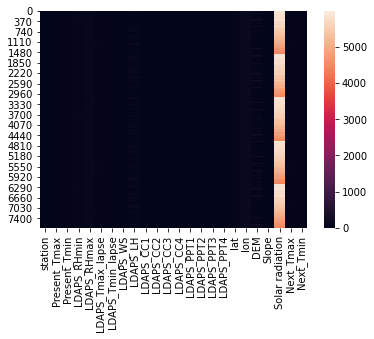

In [24]:
sns.heatmap(df)

No Null values.

<AxesSubplot:>

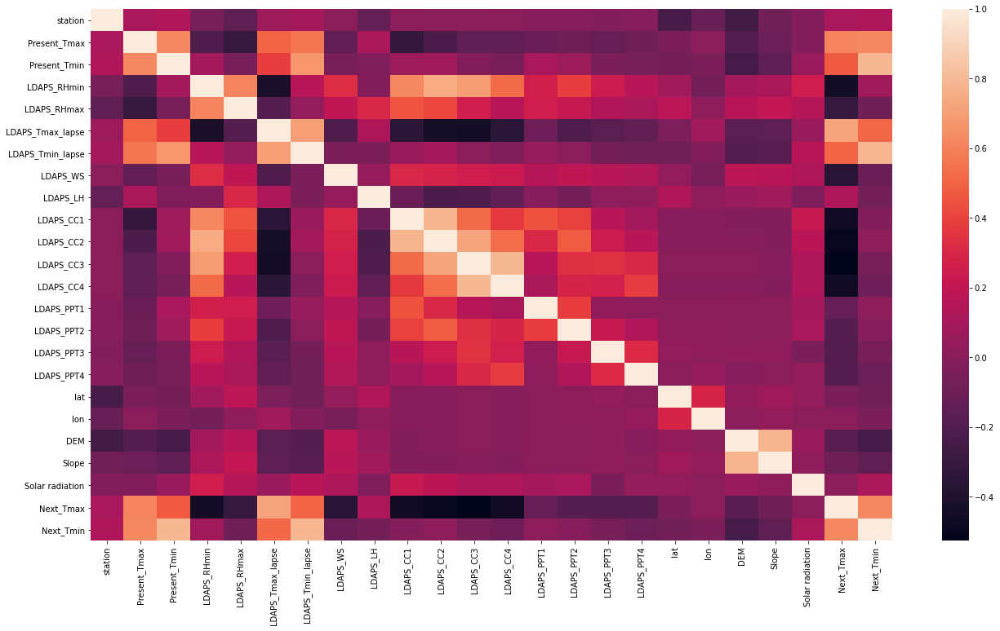

In [25]:
plt.figure(figsize=(22,12))
sns.heatmap(df_cor)

Next_Tmax is highly correlated with LDAPS_Tmax_lapse and least correlated with LDAPS_CC1.
Next_Tmin is highly correlated with Present_Tmin and least correlated with DEM.

<AxesSubplot:>

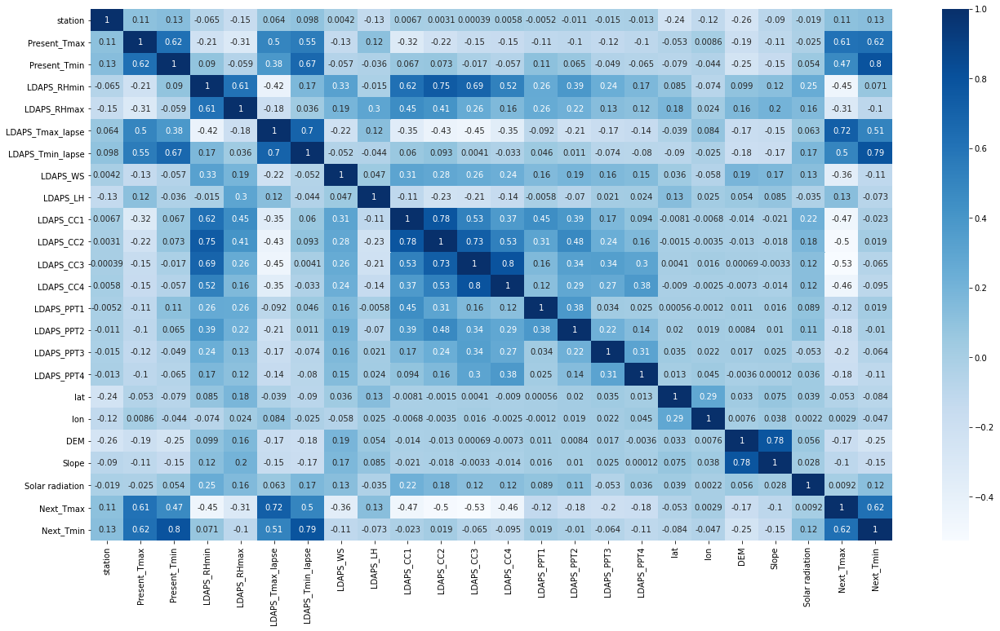

In [26]:
plt.figure(figsize=(22,12))
sns.heatmap(df_cor,cmap='Blues',annot=True)

Next_Tmax is highly correlated with LDAPS_Tmax_lapse and least correlated with LDAPS_CC1. 
Next_Tmin is highly correlated with Present_Tmin and least correlated with DEM.

<AxesSubplot:>

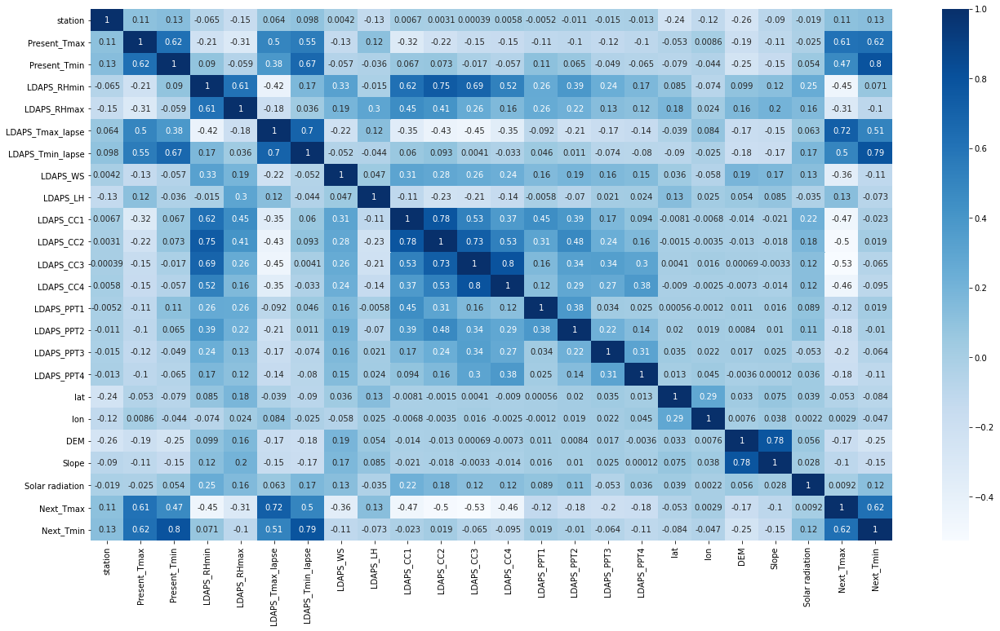

In [27]:
plt.figure(figsize=(22,12))
sns.heatmap(df_cor,cmap='Blues',annot=True)

Next_Tmax is highly correlated with LDAPS_Tmax_lapse and least correlated with LDAPS_CC1.
Next_Tmin is highly correlated with Present_Tmin and least correlated with DEM.

In [28]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

<AxesSubplot:xlabel='station', ylabel='Density'>

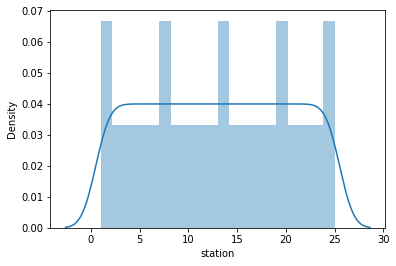

In [29]:
sns.distplot(df['station'])

No Skewness present.

<AxesSubplot:xlabel='Present_Tmax', ylabel='Density'>

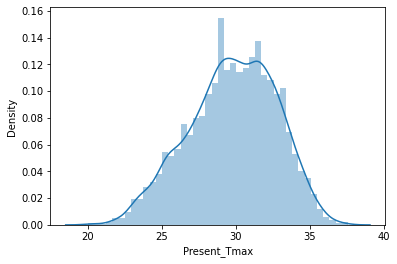

In [30]:
sns.distplot(df['Present_Tmax'])

No Skewness present.

<AxesSubplot:xlabel='Present_Tmin', ylabel='Density'>

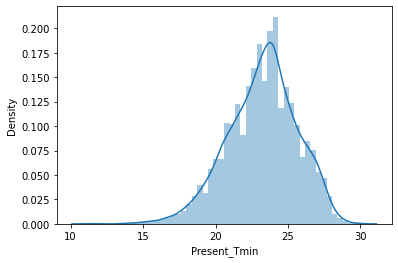

In [31]:
sns.distplot(df['Present_Tmin'])

No Skewness present.

<AxesSubplot:xlabel='LDAPS_RHmin', ylabel='Density'>

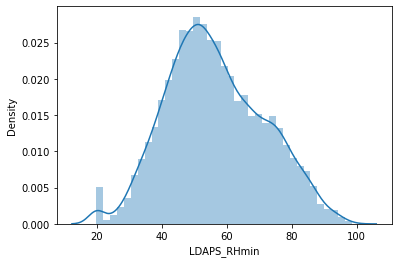

In [32]:
sns.distplot(df['LDAPS_RHmin'])

No Skewness present.

<AxesSubplot:xlabel='LDAPS_RHmax', ylabel='Density'>

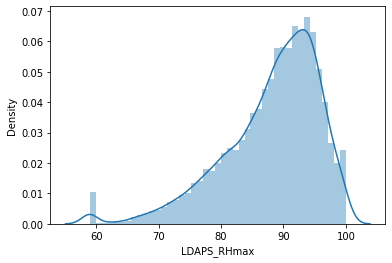

In [33]:
sns.distplot(df['LDAPS_RHmax'])

Skewness present.

<AxesSubplot:xlabel='LDAPS_Tmax_lapse', ylabel='Density'>

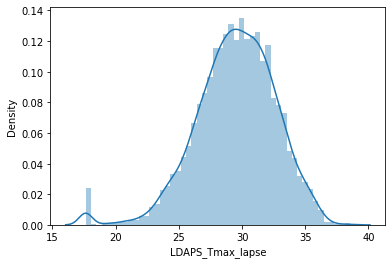

In [34]:
sns.distplot(df['LDAPS_Tmax_lapse'])

 Skewness present.

<AxesSubplot:xlabel='LDAPS_Tmin_lapse', ylabel='Density'>

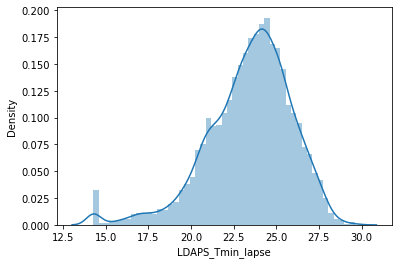

In [35]:
sns.distplot(df['LDAPS_Tmin_lapse'])

Skewness present.

<AxesSubplot:xlabel='LDAPS_WS', ylabel='Density'>

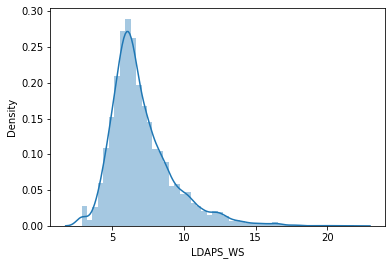

In [36]:
sns.distplot(df['LDAPS_WS'])

Skewness present.

<AxesSubplot:xlabel='LDAPS_LH', ylabel='Density'>

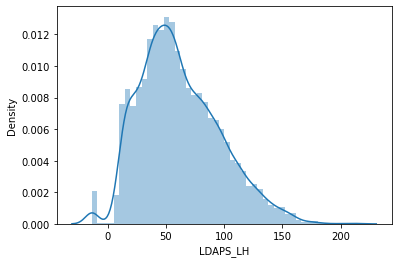

In [37]:
sns.distplot(df['LDAPS_LH'])

No Skewness present.

<AxesSubplot:xlabel='LDAPS_CC1', ylabel='Density'>

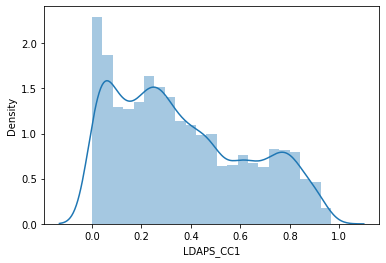

In [38]:
sns.distplot(df['LDAPS_CC1'])

No Skewness present.

<AxesSubplot:xlabel='LDAPS_CC2', ylabel='Density'>

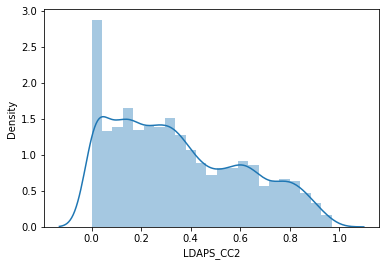

In [39]:
sns.distplot(df['LDAPS_CC2'])

No Skewness present.

<AxesSubplot:xlabel='LDAPS_CC3', ylabel='Density'>

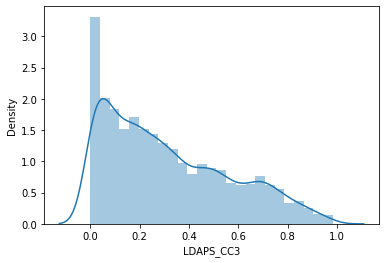

In [40]:
sns.distplot(df['LDAPS_CC3'])

 Skewness present.

<AxesSubplot:xlabel='LDAPS_CC4', ylabel='Density'>

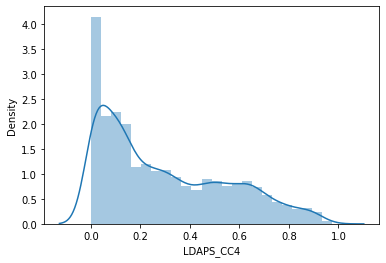

In [41]:
sns.distplot(df['LDAPS_CC4'])

Skewness present.

<AxesSubplot:xlabel='LDAPS_PPT1', ylabel='Density'>

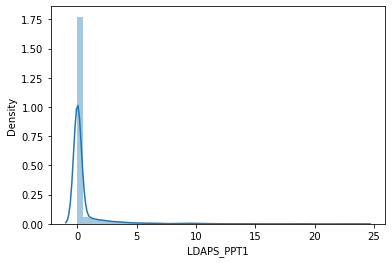

In [42]:
sns.distplot(df['LDAPS_PPT1'])

Skewness present.

<AxesSubplot:xlabel='LDAPS_PPT2', ylabel='Density'>

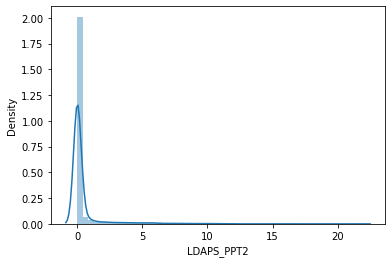

In [43]:
sns.distplot(df['LDAPS_PPT2'])

Skewness present.

<AxesSubplot:xlabel='LDAPS_PPT3', ylabel='Density'>

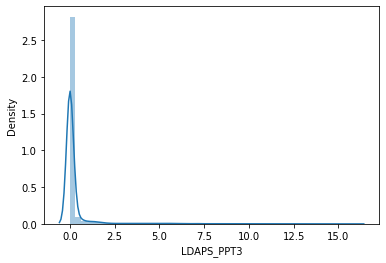

In [44]:
sns.distplot(df['LDAPS_PPT3'])

Skewness present.

<AxesSubplot:xlabel='LDAPS_PPT4', ylabel='Density'>

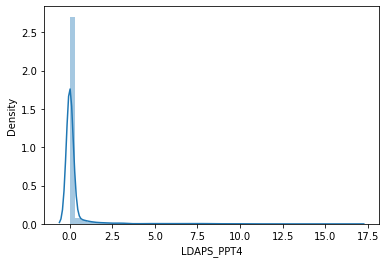

In [45]:
sns.distplot(df['LDAPS_PPT4'])

Skewness present.

<AxesSubplot:xlabel='lat', ylabel='Density'>

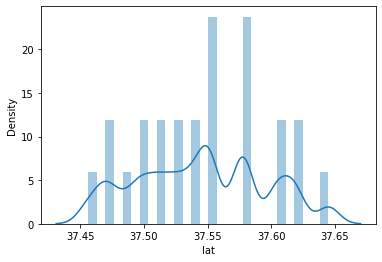

In [46]:
sns.distplot(df['lat'])

No Skewness present.

<AxesSubplot:xlabel='lon', ylabel='Density'>

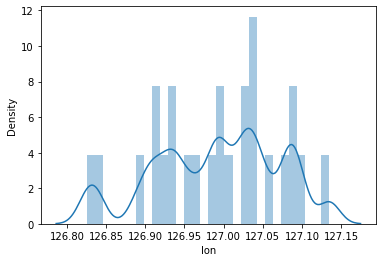

In [47]:
sns.distplot(df['lon'])

No Skewness present.

<AxesSubplot:xlabel='DEM', ylabel='Density'>

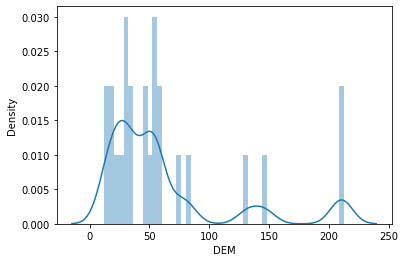

In [48]:
sns.distplot(df['DEM'])

 Skewness present.

<AxesSubplot:xlabel='Slope', ylabel='Density'>

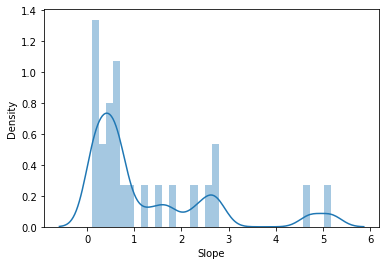

In [49]:
sns.distplot(df['Slope'])

 Skewness present.

<AxesSubplot:xlabel='Solar radiation', ylabel='Density'>

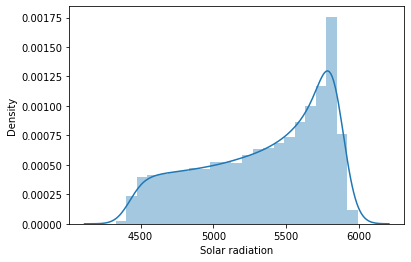

In [50]:
sns.distplot(df['Solar radiation'])

No Skewness present.

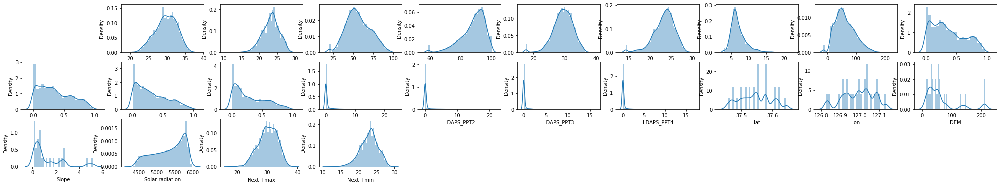

In [51]:
collist=df.columns.values
ncol=10
nrows=12
plt.figure(figsize=(35,25))
for i in range(1,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.distplot(df[collist[i]])

In [52]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

<AxesSubplot:xlabel='Next_Tmax', ylabel='station'>

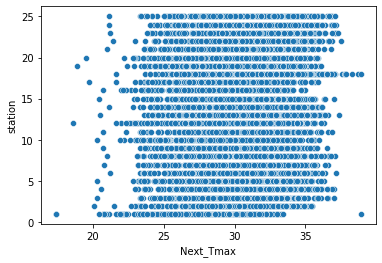

In [53]:
sns.scatterplot(x='Next_Tmax',y='station',data=df)

station is scattered equally from range 20 to 35.

<AxesSubplot:xlabel='Next_Tmax', ylabel='Present_Tmax'>

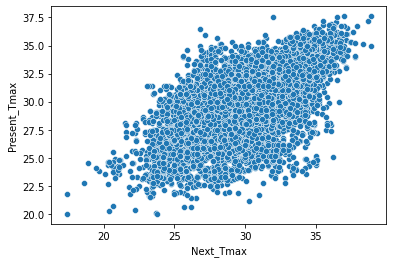

In [55]:
sns.scatterplot(x='Next_Tmax',y='Present_Tmax',data=df)

Present_Tmax has a positive relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='Present_Tmin'>

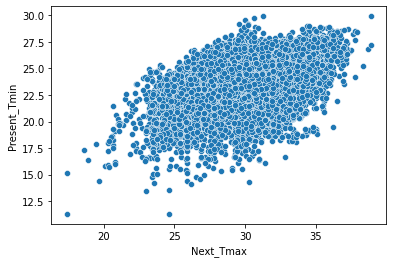

In [56]:
sns.scatterplot(x='Next_Tmax',y='Present_Tmin',data=df)

Present_Tmin has a positive relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_RHmin'>

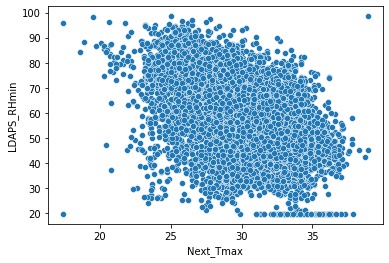

In [57]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_RHmin',data=df)

LDAPS_RHmin has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_RHmax'>

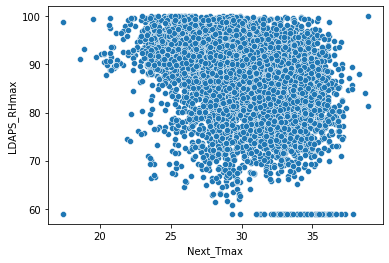

In [58]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_RHmax',data=df)

LDAPS_RHmax has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_Tmax_lapse'>

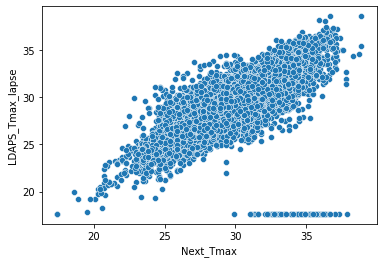

In [59]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_Tmax_lapse',data=df)

LDAPS_Tmax_lapse has a Positive relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_Tmin_lapse'>

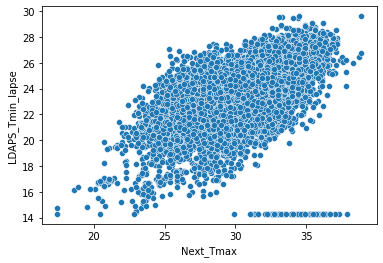

In [60]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_Tmin_lapse',data=df)

LDAPS_Tmin_lapse has a Positive relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_WS'>

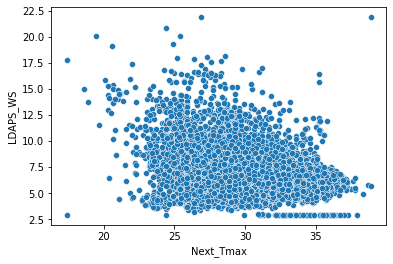

In [61]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_WS',data=df)

LDAPS_WS has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_LH'>

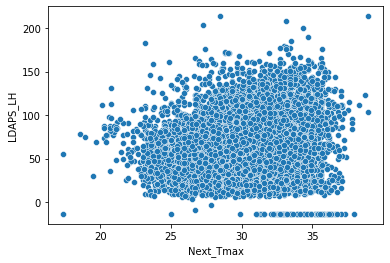

In [62]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_LH',data=df)

LDAPS_LH has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_CC1'>

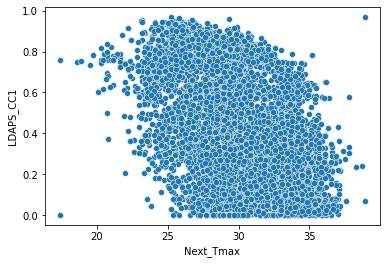

In [242]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_CC1',data=df)

LDAPS_CC1 has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_CC2'>

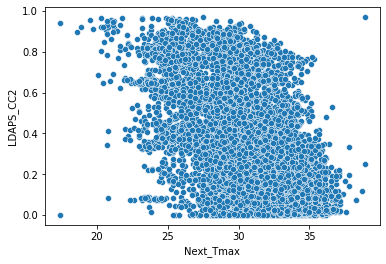

In [245]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_CC2',data=df)

LDAPS_CC2 has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_CC3'>

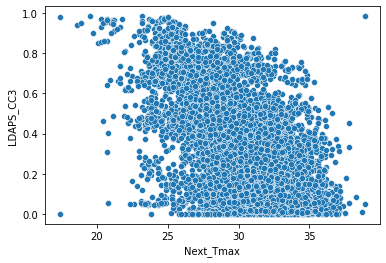

In [246]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_CC3',data=df)

LDAPS_CC3 has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_CC4'>

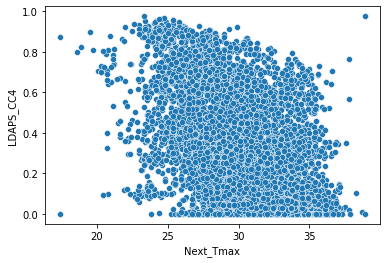

In [66]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_CC4',data=df)

LDAPS_CC4 has a Negative relationship with Next_Tmax.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_PPT1'>

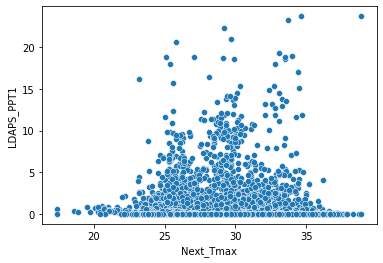

In [67]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_PPT1',data=df)

LDAPS_PPT1 is scattered lower part of the plot.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_PPT2'>

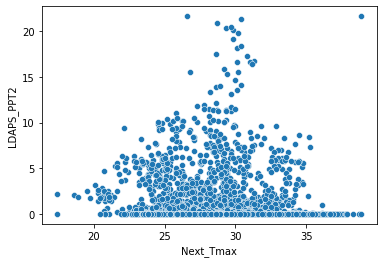

In [68]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_PPT2',data=df)

LDAPS_PPT2 is scattered mainly lower part of the plot.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_PPT3'>

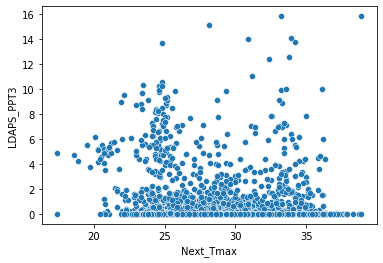

In [69]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_PPT3',data=df)

LDAPS_PPT3 is scattered lower part of the plot.

<AxesSubplot:xlabel='Next_Tmax', ylabel='LDAPS_PPT4'>

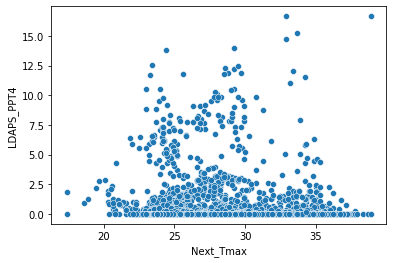

In [70]:
sns.scatterplot(x='Next_Tmax',y='LDAPS_PPT4',data=df)

LDAPS_PPT4 is scattered lower part of the plot.

<AxesSubplot:xlabel='Next_Tmax', ylabel='Solar radiation'>

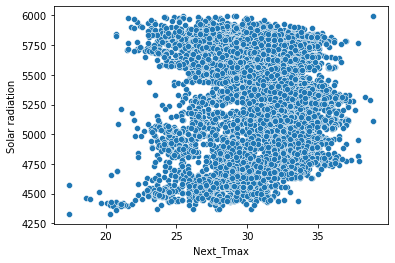

In [71]:
sns.scatterplot(x='Next_Tmax',y='Solar radiation',data=df)

Solar radiation is scattered from 20 to 40 range.

<AxesSubplot:xlabel='Next_Tmax', ylabel='Next_Tmin'>

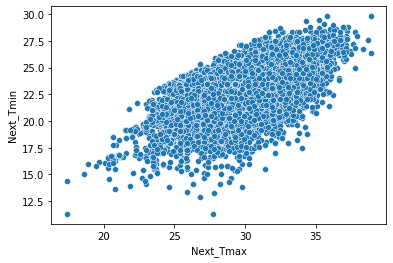

In [73]:
sns.scatterplot(x='Next_Tmax',y='Next_Tmin',data=df)

Next_Tmin has a positive relationship with Next_Tmax.

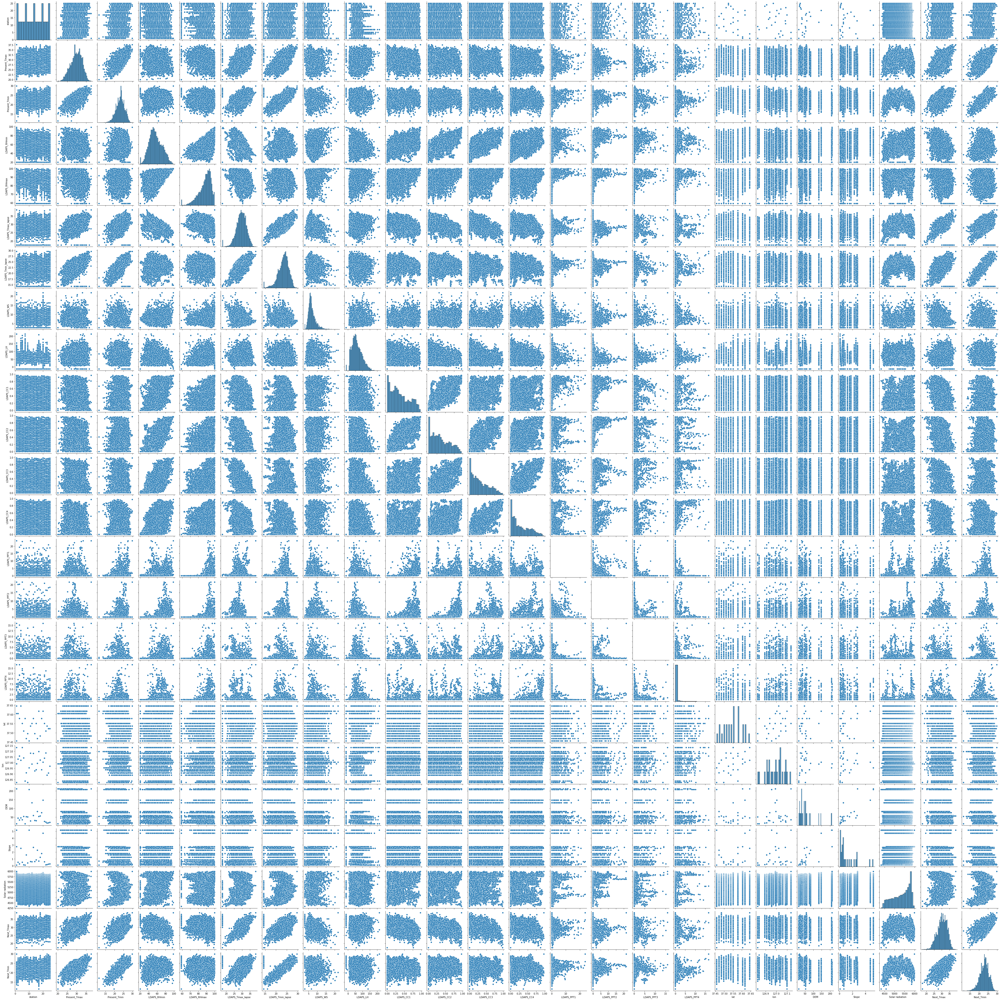

In [74]:
sns.pairplot(df)

In [75]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [76]:
df.skew()

station             0.000100
Present_Tmax       -0.276483
Present_Tmin       -0.375457
LDAPS_RHmin         0.202176
LDAPS_RHmax        -1.109283
LDAPS_Tmax_lapse   -0.601161
LDAPS_Tmin_lapse   -0.851245
LDAPS_WS            1.485885
LDAPS_LH            0.586176
LDAPS_CC1           0.460727
LDAPS_CC2           0.474379
LDAPS_CC3           0.643064
LDAPS_CC4           0.671739
LDAPS_PPT1          5.395178
LDAPS_PPT2          5.776835
LDAPS_PPT3          6.458608
LDAPS_PPT4          6.826930
lat                 0.087062
lon                -0.285213
DEM                 1.723257
Slope               1.563020
Solar radiation    -0.511210
Next_Tmax          -0.336871
Next_Tmin          -0.406685
dtype: float64

skewness present in LDAPS_RHmax,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_CC3,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,DEM and slope.

# Removing skewness

In [77]:
df['LDAPS_RHmax']=np.log1p(df['LDAPS_RHmax'])

In [78]:
df['LDAPS_Tmin_lapse']=np.log1p(df['LDAPS_Tmin_lapse'])

In [79]:
df['LDAPS_WS']=np.log1p(df['LDAPS_WS'])

In [80]:
df['LDAPS_RHmax']=np.log1p(df['LDAPS_RHmax'])

In [81]:
df['LDAPS_CC3']=np.log1p(df['LDAPS_CC3'])

In [82]:
df['LDAPS_CC4']=np.log1p(df['LDAPS_CC4'])

In [83]:
df['LDAPS_PPT1']=np.log1p(df['LDAPS_PPT1'])

In [84]:
df['LDAPS_PPT2']=np.log1p(df['LDAPS_PPT2'])

In [85]:
df['LDAPS_PPT3']=np.log1p(df['LDAPS_PPT3'])

In [86]:
df['LDAPS_PPT4']=np.log1p(df['LDAPS_PPT4'])

In [87]:
df['DEM']=np.log1p(df['DEM'])

In [88]:
df['Slope']=np.log1p(df['Slope'])

In [89]:
df.skew()

station             0.000100
Present_Tmax       -0.276483
Present_Tmin       -0.375457
LDAPS_RHmin         0.202176
LDAPS_RHmax        -1.518401
LDAPS_Tmax_lapse   -0.601161
LDAPS_Tmin_lapse   -1.338078
LDAPS_WS            0.481974
LDAPS_LH            0.586176
LDAPS_CC1           0.460727
LDAPS_CC2           0.474379
LDAPS_CC3           0.390746
LDAPS_CC4           0.449621
LDAPS_PPT1          2.766149
LDAPS_PPT2          3.195810
LDAPS_PPT3          4.014298
LDAPS_PPT4          4.230575
lat                 0.087062
lon                -0.285213
DEM                 0.443730
Slope               0.836131
Solar radiation    -0.511210
Next_Tmax          -0.336871
Next_Tmin          -0.406685
dtype: float64

In [90]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

<AxesSubplot:>

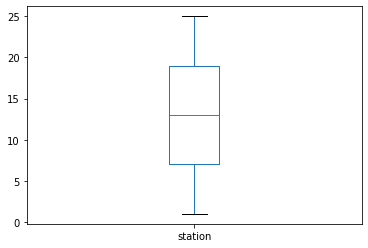

In [91]:
df['station'].plot.box()

No outliers present.

<AxesSubplot:>

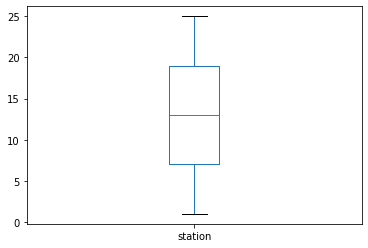

In [93]:
df['station'].plot.box()

No outliers present.

<AxesSubplot:>

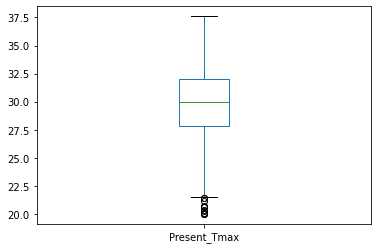

In [94]:
df['Present_Tmax'].plot.box()

outliers present.

<AxesSubplot:>

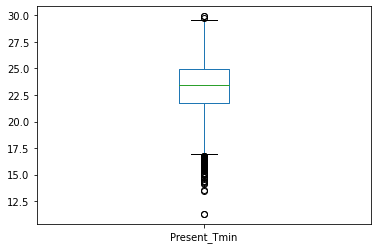

In [95]:
df['Present_Tmin'].plot.box()

outliers present.

<AxesSubplot:>

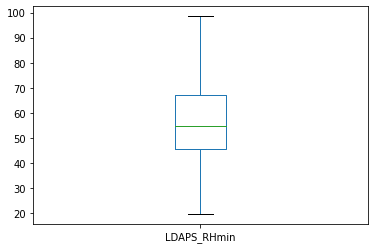

In [96]:
df['LDAPS_RHmin'].plot.box()

No outliers present.

<AxesSubplot:>

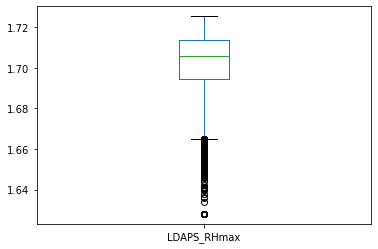

In [97]:
df['LDAPS_RHmax'].plot.box()

 outliers present.

<AxesSubplot:>

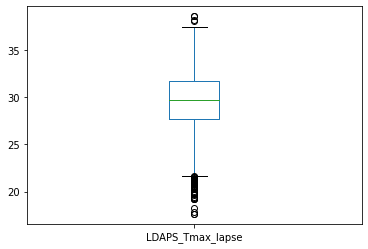

In [247]:
df['LDAPS_Tmax_lapse'].plot.box()

Outliers present.

<AxesSubplot:>

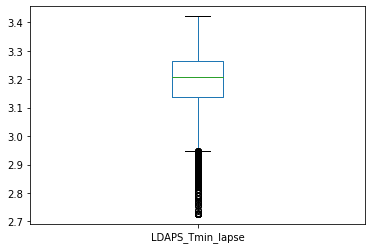

In [99]:
df['LDAPS_Tmin_lapse'].plot.box()

Outliers present.

<AxesSubplot:>

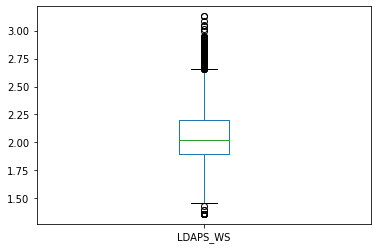

In [100]:
df['LDAPS_WS'].plot.box()

Outliers present.

<AxesSubplot:>

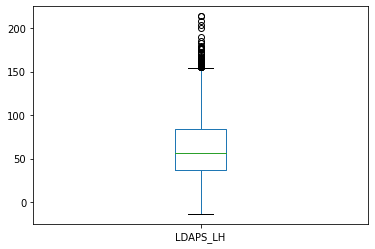

In [101]:
df['LDAPS_LH'].plot.box()

Outliers present.

<AxesSubplot:>

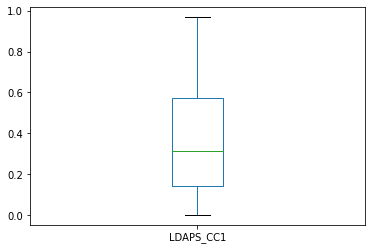

In [102]:
df['LDAPS_CC1'].plot.box()

No Outliers present.

<AxesSubplot:>

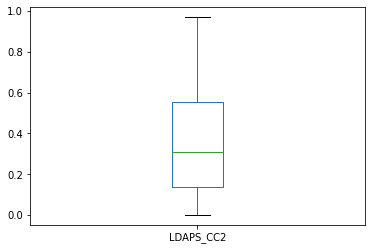

In [103]:
df['LDAPS_CC2'].plot.box()

NO Outliers present.

<AxesSubplot:>

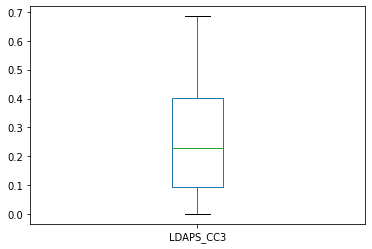

In [104]:
df['LDAPS_CC3'].plot.box()

NO Outliers present.


<AxesSubplot:>

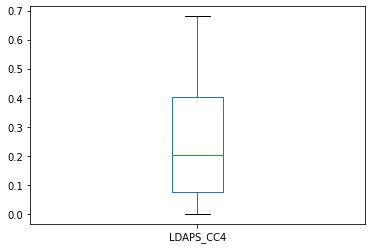

In [105]:
df['LDAPS_CC4'].plot.box()

NO Outliers present.

<AxesSubplot:>

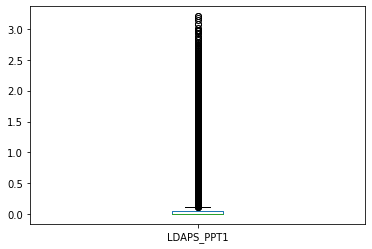

In [106]:
df['LDAPS_PPT1'].plot.box()

Outliers present.

<AxesSubplot:>

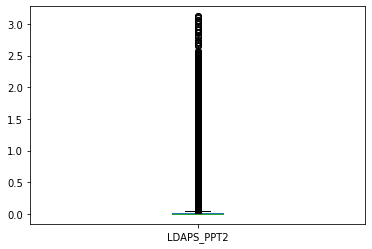

In [107]:
df['LDAPS_PPT2'].plot.box()

Outliers present.

<AxesSubplot:>

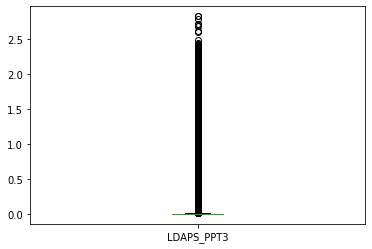

In [108]:
df['LDAPS_PPT3'].plot.box()

 Outliers present.

<AxesSubplot:>

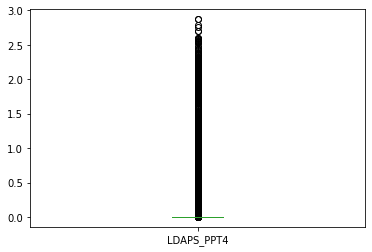

In [109]:
df['LDAPS_PPT4'].plot.box()

 Outliers present.

<AxesSubplot:>

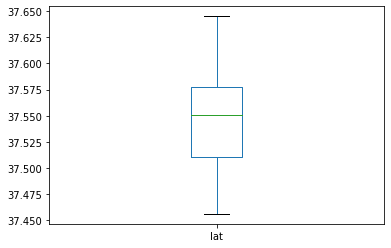

In [110]:
df['lat'].plot.box()

 No Outliers present.

<AxesSubplot:>

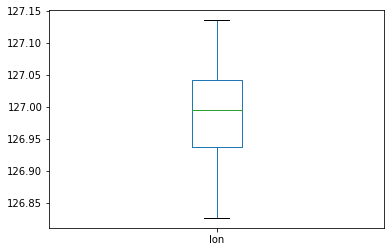

In [111]:
df['lon'].plot.box()

No Outliers present.

<AxesSubplot:>

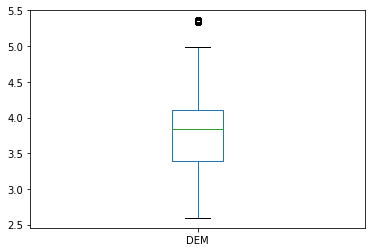

In [112]:
df['DEM'].plot.box()

 Outliers present.

<AxesSubplot:>

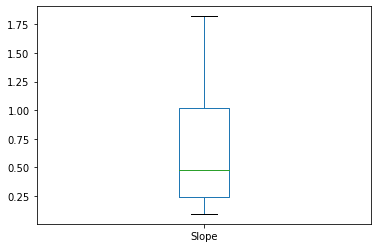

In [113]:
df['Slope'].plot.box()

 Outliers present.

<AxesSubplot:>

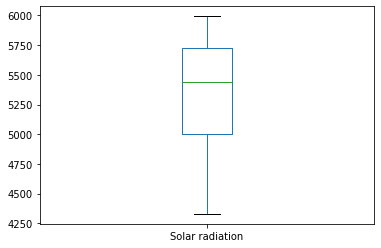

In [114]:
df['Solar radiation'].plot.box()

 Outliers present.

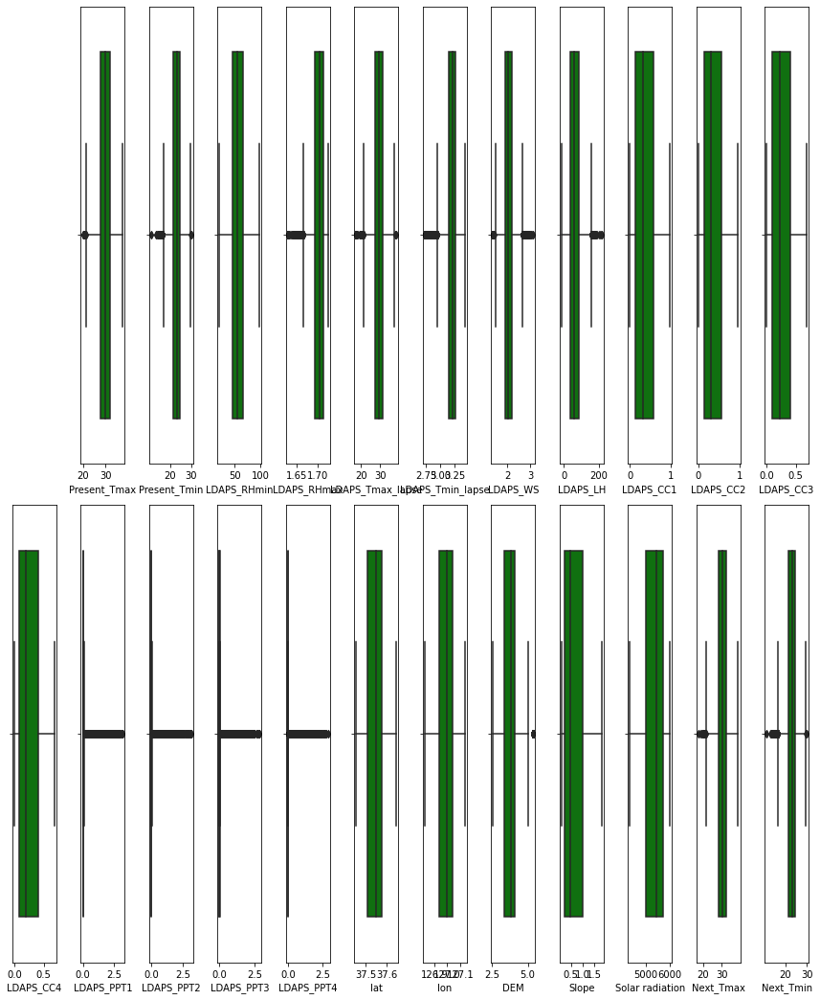

In [115]:
collist=df.columns.values
ncol=12
nrows=10
plt.figure(figsize=(ncol,6*ncol))
for i in range(1,len(collist)):
    plt.subplot(nrows,ncol,i+1)
    sns.boxplot(df[collist[i]],color='green',orient='v')
    plt.tight_layout()

# Removing Outliers

In [116]:
df.columns

Index(['station', 'Present_Tmax', 'Present_Tmin', 'LDAPS_RHmin', 'LDAPS_RHmax',
       'LDAPS_Tmax_lapse', 'LDAPS_Tmin_lapse', 'LDAPS_WS', 'LDAPS_LH',
       'LDAPS_CC1', 'LDAPS_CC2', 'LDAPS_CC3', 'LDAPS_CC4', 'LDAPS_PPT1',
       'LDAPS_PPT2', 'LDAPS_PPT3', 'LDAPS_PPT4', 'lat', 'lon', 'DEM', 'Slope',
       'Solar radiation', 'Next_Tmax', 'Next_Tmin'],
      dtype='object')

In [117]:
from scipy.stats import zscore
z=np.abs(zscore(df))
print(np.where(z>3))

(array([  25,   25,   26, ..., 7751, 7751, 7751], dtype=int64), array([ 7, 14, 14, ..., 14, 15, 16], dtype=int64))


In [118]:
df_new=df[(z<3).all(axis=1)]

In [119]:
df_new.shape

(6642, 24)

In [120]:
df.shape

(7752, 24)

7752-6642=1110 outliers are removed from dataset.

In [121]:
df_new.head()

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation,Next_Tmax,Next_Tmin
0,1.0,28.7,21.4,58.255688,1.708931,28.074101,3.178343,2.056542,69.451805,0.233947,...,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996,29.1,21.2
1,2.0,31.9,21.6,52.263397,1.707922,29.850689,3.220275,1.900896,51.937448,0.225508,...,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500,30.5,22.5
2,3.0,31.6,23.3,48.690479,1.694209,30.091292,3.241249,1.965464,20.573050,0.209344,...,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664,31.1,23.9
3,4.0,32.0,23.4,58.239788,1.719132,29.704629,3.191553,1.894624,65.727144,0.216372,...,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844,31.7,24.3
4,5.0,31.4,21.9,56.174095,1.707030,29.113934,3.198121,1.907318,107.965535,0.151407,...,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246,31.2,22.5


In [195]:
x=df_new.iloc[:,0:22]

In [196]:
x

,station,Present_Tmax,Present_Tmin,LDAPS_RHmin,LDAPS_RHmax,LDAPS_Tmax_lapse,LDAPS_Tmin_lapse,LDAPS_WS,LDAPS_LH,LDAPS_CC1,...,LDAPS_CC4,LDAPS_PPT1,LDAPS_PPT2,LDAPS_PPT3,LDAPS_PPT4,lat,lon,DEM,Slope,Solar radiation
0,1.0,28.7,21.4,58.255688,1.708931,28.074101,3.178343,2.056542,69.451805,0.233947,...,0.123039,0.0,0.0,0.0,0.0,37.6046,126.991,5.362864,1.331046,5992.895996
1,2.0,31.9,21.6,52.263397,1.707922,29.850689,3.220275,1.900896,51.937448,0.225508,...,0.120204,0.0,0.0,0.0,0.0,37.6046,127.032,3.823463,0.414821,5869.312500
2,3.0,31.6,23.3,48.690479,1.694209,30.091292,3.241249,1.965464,20.573050,0.209344,...,0.132891,0.0,0.0,0.0,0.0,37.5776,127.058,3.535344,0.235941,5863.555664
3,4.0,32.0,23.4,58.239788,1.719132,29.704629,3.191553,1.894624,65.727144,0.216372,...,0.125970,0.0,0.0,0.0,0.0,37.6450,127.022,3.844087,1.262657,5856.964844
4,5.0,31.4,21.9,56.174095,1.707030,29.113934,3.198121,1.907318,107.965535,0.151407,...,0.157022,0.0,0.0,0.0,0.0,37.5507,127.135,3.584574,0.409125,5859.552246
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7745,21.0,23.1,17.8,24.688997,1.681340,27.812697,2.960261,2.028576,9.614074,0.052902,...,0.004370,0.0,0.0,0.0,0.0,37.5507,127.040,3.306813,0.452412,4456.024414
7746,22.0,22.5,17.4,30.094858,1.693595,26.704905,2.934603,1.912218,82.146707,0.066461,...,0.017523,0.0,0.0,0.0,0.0,37.5102,127.086,3.134050,0.125045,4441.803711
7747,23.0,23.3,17.1,26.741310,1.682762,26.352081,2.984453,1.966961,72.058294,0.030034,...,0.000000,0.0,0.0,0.0,0.0,37.5372,126.891,2.808655,0.144447,4443.313965
7748,24.0,23.3,17.7,24.040634,1.679054,27.010193,2.982319,2.020596,47.241457,0.035874,...,0.000000,0.0,0.0,0.0,0.0,37.5237,126.909,2.906661,0.200734,4438.373535


In [197]:
y=df_new.iloc[:,22:24]
y

,Next_Tmax,Next_Tmin
0,29.1,21.2
1,30.5,22.5
2,31.1,23.9
3,31.7,24.3
4,31.2,22.5
...,...,...
7745,27.6,17.7
7746,28.0,17.1
7747,28.3,18.1
7748,28.6,18.8


In [198]:
xtrain, xtest, ytrain, ytest=train_test_split(x, y, test_size=0.15)
print("xtrain:", xtrain.shape, "ytrain:", ytrain.shape)

print("xtest:", xtest.shape, "ytest:", ytest.shape)


xtrain: (5645, 22) ytrian: (5645, 2)
xtest: (997, 22) ytest: (997, 2)


In [214]:
from sklearn.metrics import mean_squared_error,mean_absolute_error
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.multioutput import MultiOutputRegressor
gbr = GradientBoostingRegressor()
model1 = MultiOutputRegressor(estimator=gbr)
print(model1)

MultiOutputRegressor(estimator=GradientBoostingRegressor(alpha=0.9,
                                                         criterion='friedman_mse',
                                                         init=None,
                                                         learning_rate=0.1,
                                                         loss='ls', max_depth=3,
                                                         max_features=None,
                                                         max_leaf_nodes=None,
                                                         min_impurity_decrease=0.0,
                                                         min_impurity_split=None,
                                                         min_samples_leaf=1,
                                                         min_samples_split=2,
                                                         min_weight_fraction_leaf=0.0,
                                                         n_est

In [215]:
model1.fit(xtrain, ytrain)
score = model1.score(xtrain, ytrain)
print("Training score:", score)

ypred = model1.predict(xtest)

print("r2score:%.4f" % r2_score(ytest, ypred))
print("MSE:%.4f" % mean_squared_error(ytest, ypred))
print("MAE:%.4f" % mean_absolute_error(ytest, ypred))


Training score: 0.8803367975837257
r2score:0.8546
MSE:1.0516
MAE:0.7830


In [227]:
lr = LinearRegression()
model = MultiOutputRegressor(estimator=lr)
print(model)
model.fit(xtrain, ytrain)
score = model.score(xtrain, ytrain)
print("Training score:", score)

ypred = model.predict(xtest)

print("r2score:%.4f" % r2_score(ytest, ypred))
print("MSE:%.4f" % mean_squared_error(ytest, ypred))
print("MAE:%.4f" % mean_absolute_error(ytest, ypred))


MultiOutputRegressor(estimator=LinearRegression(copy_X=True, fit_intercept=True,
                                                n_jobs=None, normalize=False),
                     n_jobs=None)
Training score: 0.7908282652961033
r2score:0.7882
MSE:1.5254
MAE:0.9528


# Cross validation Score

In [220]:
#For Linear Regression
n_scores = cross_val_score(model, x, y, scoring='r2', cv=7, n_jobs=-1)
# force the scores to be positive
n_scores = absolute(n_scores)
print(n_scores)
print('r2_score: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

[0.66076833 0.66207303 0.71680536 0.68033686 0.72350482 0.82424597
 0.75581935]
r2_score: 0.718 (0.054)


In [219]:
# for GradientBoostingRegressor
n_scores = cross_val_score(model1, x, y, scoring='r2', cv=8)
# force the scores to be positive
n_scores = absolute(n_scores)
print(n_scores)
print('r2_score: %.3f (%.3f)' % (mean(n_scores), std(n_scores)))

[0.60581501 0.78935592 0.65557266 0.7651181  0.73636946 0.75424331
 0.83106824 0.74960875]
r2_score: 0.736 (0.068)


# Regularization :: L1 and L2 Regularization¶

In [231]:
from sklearn.linear_model  import Lasso,Ridge
ls=Lasso(alpha=0.0001)
#ls=Lasso(alpha=1.0) #Default
ls.fit(xtrain,ytrain)
ls.score(xtrain,ytrain)

0.785028343500266

In [232]:
ls.coef_

array([[ 2.03647583e-02,  1.66394188e-01,  7.94890377e-02,
         1.83910740e-02, -2.72443240e+00,  6.08260462e-01,
         1.04793009e+00, -1.18793430e+00,  7.77315961e-03,
        -5.46591915e-01, -6.68008183e-01, -9.21245903e-01,
        -2.18265759e+00, -5.40280217e-01,  2.92411211e-02,
         1.72396608e-02,  6.74503530e-01, -8.43503840e-01,
        -1.57856917e+00, -6.16091788e-02,  1.56927759e-01,
         1.52573467e-04],
       [-2.93085119e-03,  6.33586920e-02,  2.29832025e-01,
         2.17191298e-02,  1.16720888e-01,  1.08455487e-01,
         1.36033264e+01,  5.88194876e-01,  1.50695973e-03,
        -7.15857574e-02,  4.87838410e-01, -2.98330617e-01,
        -1.46249229e-01, -3.34294110e-01, -3.38189171e-01,
         8.15921401e-02, -4.47094910e-01, -1.33687314e+00,
         2.04164382e-01, -6.05291850e-01,  5.60497049e-01,
        -7.53774997e-05]])

In [233]:
rd=Ridge(alpha=0.0001)
#rd=Ridge()
rd.fit(x_train,y_train)
rd.score(x_train,y_train)

0.9999999999999992

In [234]:
rd.coef_

array([[ 1.92027988e-09,  4.01290077e-08,  6.65643742e+01,
        -9.85738625e-09,  6.12121808e+01,  6.65340917e-08,
        -1.51974703e-08, -5.48351960e-08,  1.47523615e-08,
         5.28881485e-08, -6.36590814e-09,  5.75289830e-08,
        -4.84168480e-08,  3.32290419e-08,  7.64054477e-08,
         4.48068668e+01,  2.12984714e+01,  7.66669875e+01,
        -2.44701873e-08, -2.63998516e-08,  3.60461710e-09,
         4.55425922e-08,  4.31452868e-08,  1.08041050e-07],
       [-7.68602066e-09, -2.41226581e-09,  3.98025184e-01,
        -1.03375802e-08,  2.01231286e+01,  2.07149858e-08,
        -3.54844470e-08, -2.62772461e-09, -1.32892171e-08,
         2.90232992e-08, -1.85030748e-08, -2.19167367e-08,
        -4.90269972e-08,  1.44467530e-08,  1.87745757e-08,
         9.29056740e+01,  3.45116179e+00,  4.17076514e+01,
        -2.73379278e-09,  1.68752949e-08, -1.78923144e-08,
         2.42764096e-08,  3.31327394e-08,  9.31341661e-09]])

In [235]:
from sklearn.linear_model import ElasticNet
enr=ElasticNet(alpha=0.0001)
#enr=ElasticNet()
enr.fit(x_train,y_train)
enrpred=enr.predict(x_test)
print(enr.score(x_train,y_train))
enr.coef_

0.9999999974043057


array([[ 0.00000000e+00,  7.21114696e-05,  6.65608753e+01,
         0.00000000e+00,  6.12092619e+01,  1.35029505e-04,
        -0.00000000e+00, -7.99193738e-05,  0.00000000e+00,
         5.59085576e-05,  0.00000000e+00,  8.31218154e-05,
        -5.90829314e-05,  2.87923066e-05,  1.21782299e-04,
         4.48045275e+01,  2.12973731e+01,  7.66630906e+01,
        -6.65855665e-06, -1.18874969e-05,  0.00000000e+00,
         5.86464036e-05,  4.54523720e-05,  1.98979372e-04],
       [ 0.00000000e+00,  0.00000000e+00,  3.97913153e-01,
         0.00000000e+00,  2.01222576e+01,  0.00000000e+00,
        -3.48801642e-05,  0.00000000e+00, -0.00000000e+00,
         1.08612846e-05, -0.00000000e+00, -2.65033524e-06,
        -5.79709957e-05,  0.00000000e+00,  0.00000000e+00,
         9.29008613e+01,  3.45090993e+00,  4.17055029e+01,
        -0.00000000e+00,  0.00000000e+00, -0.00000000e+00,
         6.12358073e-06,  2.75753673e-05,  0.00000000e+00]])

# Ensemble Techniques¶

In [236]:
from sklearn.ensemble import RandomForestRegressor

rf=RandomForestRegressor(n_estimators=100,random_state=42)
#by default n_estimators=100
rf.fit(xtrain,ytrain)
predrf=rf.predict(xtest)
print(r2_score(ytest,predrf))
print(mean_squared_error(ytest,predrf))

0.883341893301407
0.8244899969909725


# Saving The model

In [221]:
import joblib
joblib.dump(lr,'temp_forecast.obj')

['temp_forecast.obj']

In [223]:
file=joblib.load('temp_forecast.obj')

In [230]:
file.fit(xtrain,ytrain)
file.predict(xtest)

array([[31.70297027, 24.30282883],
       [26.41963815, 22.52952502],
       [28.00869567, 22.79188047],
       ...,
       [33.18085069, 23.47428823],
       [25.41706296, 21.11370818],
       [32.89619597, 22.84755973]])